<a href="https://colab.research.google.com/github/OscarDJB/CD_Databits/blob/main/01_Proyecto_final_Fase_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<div style="text-align: center; line-height: 0; padding-top: 9px;">
  <img src="https://storage.googleapis.com/datasets-academy/public-img/notebooks/headers/databits-header-notebook.png" alt="Databricks Learning" style="width: 100%;">
</div>


# <center>  Proyecto Final - Fase 1  </center>

## Descripción
En esta fase se explicará el proyecto y se realizará la carga de los datos. Además se implementará el correspondiente análisis exploratorio de datos (EDA)
  
<img alt="Caution" title="Caution" style="vertical-align: text-bottom; position: relative; height:1.3em; top:0.0em" src="https://storage.googleapis.com/datasets-academy/public-img/notebooks/icons/danger.png"/> **Disclaimer:** Este material ha sido preparado por el equipo de **handytec Academy®**. Se prohibe la publicación o reproducción de este material sin previa autorización de **handytec Academy®** - 2022 Todos los derechos reservados.

## Problema de negocio

Un problema imperante en el entorno bancario a nivel global se enfoca en el riesgo crediticio o riesgo de impago. 
  
Este aspecto hace refencia a las pérdidas que incurren los bancos dado que los prestamistas son incapaces de devolver los créditos otorgados. 

Lo cual conlleva la siguiente pregunta: **¿Cómo poder reducir el número de personas que caen en mora crediticia?**

## Objetivos del proyecto

El objetivo de este proyecto es construir un modelo que las entidades financieras puedan usar para ayudar a tomar las mejores decisiones financieras.

Este modelo identificará la probabilidad de caer en mora crediticia por parte de los clientes que recibieron un crédito (modelos de default comportamentales).

Mediante el uso de diferentes algoritmos se obtendrá la probabilidad de impago en cada individuo. El principal indicador que se va usar para ver la bonanza de los distintos modelos va a ser el AUC (Area Under the Curve) generado por las curvas ROC.

## Importar librerías y verificar versiones

In [1]:
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import matplotlib
import matplotlib.pyplot as plt

In [2]:
print('** Versiones Actuales | Requeridas **')
print('Python:\nVersion Actual:', sys.version, ' | Requerida >= 3.6')
print('NumPy:\nVersion Actual: {:10} | Requerida >= 1.16.2'.format(np.__version__))
print('Pandas:\nVersion Actual: {:10}| Requerida >= 1.0.1'.format(pd.__version__))
print('Matplotlib:\nVersion Actual: {:10} | Requerida >= 3.0.3'.format(matplotlib.__version__))
print('Seaborn:\nVersion Actual: {:10} |Requerida >= 0.9.0 '.format(sns.__version__))

** Versiones Actuales | Requeridas **
Python:
Version Actual: 3.8.16 (default, Dec  7 2022, 01:12:13) 
[GCC 7.5.0]  | Requerida >= 3.6
NumPy:
Version Actual: 1.21.6     | Requerida >= 1.16.2
Pandas:
Version Actual: 1.3.5     | Requerida >= 1.0.1
Matplotlib:
Version Actual: 3.2.2      | Requerida >= 3.0.3
Seaborn:
Version Actual: 0.11.2     |Requerida >= 0.9.0 


## Descripción de las variables contenidas en el _dataset_

El _dataset_ usado proviene de la plataforma **Kaggle**, y se encuentra separado en dos partes. 

La primera parte contiene los datos que serán usados para el entrenamiento del modelo, que serán nombrados como *datos_training*. La segunda parte son los datos que se usarán para el test del modelo *datos_test*. Estas muestras contienen 150.000 y 101.503 registros, respectivamente (aunque existen algunos campos que tienen distintos valores ausentes). 

Accesso a la Competencia **Give Me Some Credit:** [Link de acceso](https://www.kaggle.com/c/GiveMeSomeCredit/overview)

Link de descarga correspondiente a cada dataset: 
* [training data](https://storage.googleapis.com/datasets-academy/Track%20Data%20Science/Proyecto%20Final/cs-training.csv)
* [test data](https://storage.googleapis.com/datasets-academy/Track%20Data%20Science/Proyecto%20Final/cs-test.csv)

* **SeriousDlqin2yrs:** Persona que tiene 90 días de morosidad vencida o peor (Si = 1 y  No = 0)
* **RevolvingUtilizationOfUnsecuredLines:** El saldo total en tarjetas de crédito y líneas de crédito personales (excepto bienes inmuebles y sin deuda a plazos) sobre la suma de los límites de crédito
* **Age:** Edad prestamista en años 
* **NumberOfTime30-59DaysPastDueNotWorse:** Número de veces que el prestatario ha caido en mora entre 30 y 59 días, pero no ha empeorado en los últimos 2 años 
* **DebtRatio:** Pagos mensuales de deuda sobre el ingreso bruto mensual 
* **MonthlyIncome:** Ingreso mensual 
* **NumberOfOpenCreditLinesAndLoans:** Número de préstamos abiertos (cuotas como préstamos para automóviles o hipotecas) y líneas de crédito 
* **NumberOfTimes90DaysLate:** Número de veces que el prestatario ha caido en mora entre 90 días o más 
* **NumberRealEstateLoansOrLines:** Número de préstamos hipotecarios e inmobiliarios, incluidas las líneas de crédito hipotecario 
* **NumberOfTime60-89DaysPastDueNotWorse:** Número de veces que el prestatario ha caido en mora entre 60 y 89 días, pero no ha empeorado en los últimos 2 años 
* **NumberOfDependents:** Número de dependientes en la familia excluyendose a si mismos (ej: cónyuge, hijos, etc.)

## Carga de los datos

### **Importante**

Recordar descargar los archivos localmente y subirlos al sistema de archivos de Google Colab

In [3]:
# Colocar la ruta del directorio correspondiente a cada dataset
from google.colab import drive
drive.mount('/content/drive')

ruta_training = "/content/drive/MyDrive/Colab Notebooks/cs-training.csv"
ruta_test     = "/content/drive/MyDrive/Colab Notebooks/cs-test.csv"

Mounted at /content/drive


In [4]:
# Lectura de los datos usando pandas (creación de DataFrames)
datos_training = pd.read_csv(ruta_training, sep = ',', decimal = '.', index_col = 0)
datos_test     = pd.read_csv(ruta_test,     sep = ',', decimal = '.', index_col = 0)

## Revisión preliminar de los datasets

**Importante:** Realizar un comparativa entre el conjunto de datos de entrenamiento y test ejecutando las siguientes instrucciones

In [5]:
# Imprimir las 10 primeras filas de los datos de entrenamiento
print("Las 10 primeras filas de los datos de test:")
datos_training.head(10)

Las 10 primeras filas de los datos de test:


,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
6,0,0.213179,74,0,0.375607,3500.0,3,0,1,0,1.0
7,0,0.305682,57,0,5710.000000,NaN,8,0,3,0,0.0
8,0,0.754464,39,0,0.209940,3500.0,8,0,0,0,0.0
9,0,0.116951,27,0,46.000000,NaN,2,0,0,0,NaN
10,0,0.189169,57,0,0.606291,23684.0,9,0,4,0,2.0


In [6]:
# Imprimir las 10 últimas filas de los datos de test (usar el método tail)
print("Las 10 últimas filas de los datos de test:")
datos_test.tail(10)

Las 10 últimas filas de los datos de test:


,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
101494,NaN,0.035549,58,0,0.290323,11128.0,7,0,2,0,2.0
101495,NaN,0.218356,56,0,0.295803,1500.0,3,0,0,0,0.0
101496,NaN,0.718874,35,1,0.308047,4125.0,8,0,0,1,2.0
101497,NaN,0.021654,78,0,18.000000,NaN,8,0,0,0,0.0
101498,NaN,0.045230,67,0,0.012198,5000.0,4,0,0,0,0.0
101499,NaN,0.282653,24,0,0.068522,1400.0,5,0,0,0,0.0
101500,NaN,0.922156,36,3,0.934217,7615.0,8,0,2,0,4.0
101501,NaN,0.081596,70,0,836.000000,NaN,3,0,0,0,NaN
101502,NaN,0.335457,56,0,3568.000000,NaN,8,0,2,1,3.0
101503,NaN,0.441842,29,0,0.198918,5916.0,12,0,0,0,0.0


In [7]:
# Imprimir el número de filas y columnas de ambos datasets
print("El número de columnas y filas de los datos de entrenamiento:", datos_training.shape)
print("El número de columnas y filas de los datos de prueba:", datos_test.shape)

El número de columnas y filas de los datos de entrenamiento: (150000, 11)
El número de columnas y filas de los datos de prueba: (101503, 11)


In [8]:
# Imprimir los tipos de datos de cada columna en el dataset de entrenamiento
print("Tipos de datos de cada columna en el dataset de entrenamiento:")
print()
datos_training.dtypes

Tipos de datos de cada columna en el dataset de entrenamiento:



SeriousDlqin2yrs                          int64
RevolvingUtilizationOfUnsecuredLines    float64
age                                       int64
NumberOfTime30-59DaysPastDueNotWorse      int64
DebtRatio                               float64
MonthlyIncome                           float64
NumberOfOpenCreditLinesAndLoans           int64
NumberOfTimes90DaysLate                   int64
NumberRealEstateLoansOrLines              int64
NumberOfTime60-89DaysPastDueNotWorse      int64
NumberOfDependents                      float64
dtype: object

In [9]:
# Imprimir los tipos de datos de cada columna en el dataset de test
print("Tipos de datos de cada columna en el dataset de prueba:")
print()
datos_test.dtypes

Tipos de datos de cada columna en el dataset de prueba:



SeriousDlqin2yrs                        float64
RevolvingUtilizationOfUnsecuredLines    float64
age                                       int64
NumberOfTime30-59DaysPastDueNotWorse      int64
DebtRatio                               float64
MonthlyIncome                           float64
NumberOfOpenCreditLinesAndLoans           int64
NumberOfTimes90DaysLate                   int64
NumberRealEstateLoansOrLines              int64
NumberOfTime60-89DaysPastDueNotWorse      int64
NumberOfDependents                      float64
dtype: object

## Análisis exploratorio de datos

Los siguientes bloques de código nos vamos a enfocar en analizar el DataFrame `datos_training`.

**Importante:** Ejecutar las instrucciones e interpretar los resultados

### Análisis de valores duplicados

In [10]:
# Contabilizar filas duplicadas en todas sus columnas empleando los métodos duplicated() y value_counts() en el DataFrames datos_training
clean_training = datos_training.drop_duplicates()

print("El número de columnas y filas de los datos de entrenamiento:", datos_training.shape)
print("El número de columnas y filas de los datos de entrenamiento SIN duplicados:", clean_training.shape)
print()
clean_training.value_counts()

El número de columnas y filas de los datos de entrenamiento: (150000, 11)
El número de columnas y filas de los datos de entrenamiento SIN duplicados: (149391, 11)



SeriousDlqin2yrs  RevolvingUtilizationOfUnsecuredLines  age  NumberOfTime30-59DaysPastDueNotWorse  DebtRatio  MonthlyIncome  NumberOfOpenCreditLinesAndLoans  NumberOfTimes90DaysLate  NumberRealEstateLoansOrLines  NumberOfTime60-89DaysPastDueNotWorse  NumberOfDependents
0                 0.000000                              21   0                                     0.000000   0.0            1                                0                        0                             0                                     0.0                   1
                  0.442830                              39   1                                     0.951220   2992.0         4                                0                        1                             0                                     2.0                   1
                  0.442981                              35   0                                     0.102842   7000.0         3                                0                     

### Análisis de valores perdidos

In [11]:
# Identificar el número de filas con valores perdidos por cada columna con los métodos isnull() y sum() en el DataFrames datos_training

print("Número de filas con valores perdidos por cada columna:")
clean_training.isnull().sum()

Número de filas con valores perdidos por cada columna:


SeriousDlqin2yrs                            0
RevolvingUtilizationOfUnsecuredLines        0
age                                         0
NumberOfTime30-59DaysPastDueNotWorse        0
DebtRatio                                   0
MonthlyIncome                           29221
NumberOfOpenCreditLinesAndLoans             0
NumberOfTimes90DaysLate                     0
NumberRealEstateLoansOrLines                0
NumberOfTime60-89DaysPastDueNotWorse        0
NumberOfDependents                       3828
dtype: int64

### Análisis univariante

**Importante:** Ejecutar las instrucciones e interpretar los resultados

In [12]:
# Analizar las principales estadísticas descriptivas de cada columna en el DataFrame datos_training (usar el método describe)

print("Principales estadísticas descriptivas de cada columna en el DataFrame datos_training:")
clean_training.describe()

Principales estadísticas descriptivas de cada columna en el DataFrame datos_training:


,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,149391.000000,149391.000000,149391.000000,149391.000000,149391.000000,1.201700e+05,149391.000000,149391.000000,149391.000000,149391.000000,145563.000000
mean,0.066999,6.071087,52.306237,0.393886,354.436740,6.675098e+03,8.480892,0.238120,1.022391,0.212503,0.759863
std,0.250021,250.263672,14.725962,3.852953,2041.843455,1.438958e+04,5.136515,3.826165,1.130196,3.810523,1.116141
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.030132,41.000000,0.000000,0.177441,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.154235,52.000000,0.000000,0.368234,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.556494,63.000000,0.000000,0.875279,8.250000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


In [13]:
# Realizar un conteo de las categorías en la variable SeriousDlqin2yrs empleando value_counts()
clean_training.groupby(['SeriousDlqin2yrs']).count()


,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
SeriousDlqin2yrs,,,,,,,,,,
0,139382,139382,139382,139382,111815,139382,139382,139382,139382,135732
1,10009,10009,10009,10009,8355,10009,10009,10009,10009,9831


Con el dataframe **datos_training**, realizar el siguiente análisis para la variable `MonthlyIncome`

In [14]:
ingresos = clean_training.MonthlyIncome

In [15]:
# Analizar las principales estadísticas descriptivas de la columna ingresos

media    = ingresos.mean()
mediana  = ingresos.median()
moda     = ingresos.mode()

print('El valor promedio es: ', media, '\nLa mediana es: ', mediana, '\nLa moda: ', moda[0])

print("El ingreso mínimo es de:", ingresos.min())
print("El ingreso máximo es de:", ingresos.max())
print("El rango es igual a:", ingresos.max()-ingresos.min())

print("La varianza en la población es igual a:", ingresos.var(ddof=0))
print("La desviación estandar en la población es igual a:", ingresos.std(ddof=0))

print("La varianza en la muestra es igual a:", ingresos.var(ddof=1))
print("La desviación estandar en la muestra es igual a:", ingresos.std(ddof=1))

El valor promedio es:  6675.098269118748 
La mediana es:  5400.0 
La moda:  5000.0
El ingreso mínimo es de: 0.0
El ingreso máximo es de: 3008750.0
El rango es igual a: 3008750.0
La varianza en la población es igual a: 207058354.162491
La desviación estandar en la población es igual a: 14389.522374369866
La varianza en la muestra es igual a: 207060077.22213337
La desviación estandar en la muestra es igual a: 14389.58224626877


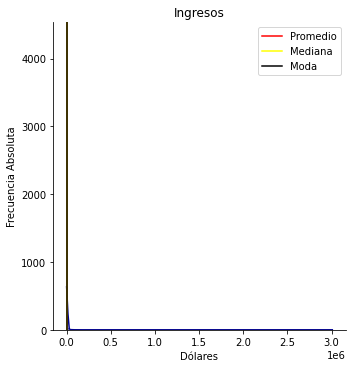

In [16]:
# Crear un histograma de la variable ingresos (usar la librería seaborns)

sns.displot(ingresos, color ="darkblue", kde=True)
plt.title("Ingresos")
plt.xlabel("Dólares")
plt.ylabel("Frecuencia Absoluta")
plt.axvline(media, color='red', label='Promedio')
plt.axvline(mediana, color='yellow', label='Mediana')
plt.axvline(moda[0], color='black', label='Moda')
plt.legend()
plt.show()

In [17]:
# Obtener los deciles de la variable ingresos
ingresos.quantile(np.arange(0.1, 1, 0.1))

0.1     2029.0
0.2     3000.0
0.3     3800.0
0.4     4550.0
0.5     5400.0
0.6     6310.0
0.7     7500.0
0.8     9083.0
0.9    11666.0
Name: MonthlyIncome, dtype: float64

El límite inferior para valores extremos es: nan
El límite superior para valores extremos es: nan


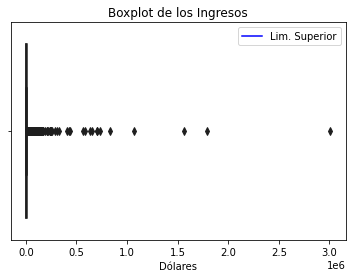

In [18]:
# Crear un box-plot la variable ingresos (usar la librería seaborns)
IQR  = stats.iqr(ingresos)
whis = 1.5
cons = IQR * whis

#Cuartiles
Q1   = ingresos.quantile(0.25)
Q3   = ingresos.quantile(0.75)

print("El límite inferior para valores extremos es:", (Q1-cons))
print("El límite superior para valores extremos es:", (Q3+cons))

sns.boxplot(x=ingresos, color="darkgreen", whis=1.5) 
plt.title("Boxplot de los Ingresos")
plt.xlabel("Dólares")
plt.axvline(Q3+cons, color='blue', label='Lim. Superior')
plt.legend()
plt.show()


### Análisis multivariante

**Importante:** Ejecutar las instrucciones e interpretar los resultados

In [19]:
# Agrupar el dataframe datos_training por la variable SeriousDlqin2yrs y emplear como formas de agregación el promedio y la mediana
training_gb = clean_training.groupby(['SeriousDlqin2yrs'])['MonthlyIncome'].mean()
print("El promedio de la variable es:",training_gb)

print()

training_gb = clean_training.groupby(['SeriousDlqin2yrs'])['MonthlyIncome'].median()
print("La mediana de la variable es:",training_gb)

El promedio de la variable es: SeriousDlqin2yrs
0    6753.036194
1    5632.054698
Name: MonthlyIncome, dtype: float64

La mediana de la variable es: SeriousDlqin2yrs
0    5475.0
1    4500.0
Name: MonthlyIncome, dtype: float64


Matriz de correlaciones

In [20]:
# Generar la matriz de correlaciones entre las variables del DataFrame datos_training
print('La matriz de covarianzas es:')
clean_training.cov().round(decimals=2)

La matriz de covarianzas es:


,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
SeriousDlqin2yrs,0.06,-0.11,-0.43,0.13,-3.94,-7.252000e+01,-0.04,0.12,-0.00,0.10,0.01
RevolvingUtilizationOfUnsecuredLines,-0.11,62631.91,-21.89,-1.24,2016.31,2.633581e+04,-14.71,-0.97,1.74,-0.95,0.42
age,-0.43,-21.89,216.85,-3.13,727.38,7.700290e+03,11.12,-2.98,0.54,-2.73,-3.49
NumberOfTime30-59DaysPastDueNotWorse,0.13,-1.24,-3.13,14.85,-46.51,-5.002500e+02,-0.97,14.45,-0.12,14.45,0.00
DebtRatio,-3.94,2016.31,727.38,-46.51,4169124.70,-1.755776e+05,511.96,-61.11,276.04,-54.18,-89.36
MonthlyIncome,-72.52,26335.81,7700.29,-500.25,-175577.63,2.070601e+08,6774.41,-620.37,2062.37,-536.34,1031.58
NumberOfOpenCreditLinesAndLoans,-0.04,-14.71,11.12,-0.97,511.96,6.774410e+03,26.38,-1.49,2.50,-1.29,0.36
NumberOfTimes90DaysLate,0.12,-0.97,-2.98,14.45,-61.11,-6.203700e+02,-1.49,14.64,-0.19,14.45,-0.03
NumberRealEstateLoansOrLines,-0.00,1.74,0.54,-0.12,276.04,2.062370e+03,2.50,-0.19,1.28,-0.16,0.16
NumberOfTime60-89DaysPastDueNotWorse,0.10,-0.95,-2.73,14.45,-54.18,-5.363400e+02,-1.29,14.45,-0.16,14.52,-0.03


In [21]:
print('La matriz de correlaciones es:')
clean_training.corr().round(decimals=2)

La matriz de correlaciones es:


,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
SeriousDlqin2yrs,1.00,-0.00,-0.12,0.13,-0.01,-0.02,-0.03,0.12,-0.01,0.11,0.05
RevolvingUtilizationOfUnsecuredLines,-0.00,1.00,-0.01,-0.00,0.00,0.01,-0.01,-0.00,0.01,-0.00,0.00
age,-0.12,-0.01,1.00,-0.06,0.02,0.04,0.15,-0.05,0.03,-0.05,-0.21
NumberOfTime30-59DaysPastDueNotWorse,0.13,-0.00,-0.06,1.00,-0.01,-0.01,-0.05,0.98,-0.03,0.98,0.00
DebtRatio,-0.01,0.00,0.02,-0.01,1.00,-0.03,0.05,-0.01,0.12,-0.01,-0.04
MonthlyIncome,-0.02,0.01,0.04,-0.01,-0.03,1.00,0.09,-0.01,0.12,-0.01,0.06
NumberOfOpenCreditLinesAndLoans,-0.03,-0.01,0.15,-0.05,0.05,0.09,1.00,-0.08,0.43,-0.07,0.06
NumberOfTimes90DaysLate,0.12,-0.00,-0.05,0.98,-0.01,-0.01,-0.08,1.00,-0.04,0.99,-0.01
NumberRealEstateLoansOrLines,-0.01,0.01,0.03,-0.03,0.12,0.12,0.43,-0.04,1.00,-0.04,0.12
NumberOfTime60-89DaysPastDueNotWorse,0.11,-0.00,-0.05,0.98,-0.01,-0.01,-0.07,0.99,-0.04,1.00,-0.01


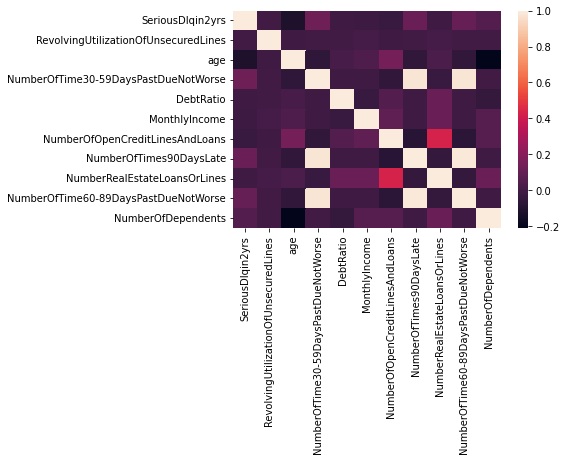

In [22]:
# Graficar la matriz de correlaciones

dataplot = sns.heatmap(clean_training.corr().round(decimals=2))

plt.show()

---

## Perfilamiento de datos

**Introducción:**
El perfilamiento de datos es **el proceso de revisión exhaustiva de las fuentes de información**, la comprensión de su estructura, contenido e interrelaciones, identificando su potencial o problemáticas para futuros proyectos. Consta de diferentes **técnicas estadísticas** que proporcionan información sobre las **características cualitativas de los datos**, siendo unos de sus objetivos principales el descubrir y validar los metadatos.

El perfilamiento ayuda a descubrir, comprender y organizar los datos, respondiendo las siguientes preguntas podremos visibilizar como estamos gestionando los datos de nuestra organización.

* ¿Los datos están completos?, ¿Existen valores blancos o nulos?
* ¿Los datos son únicos?, ¿Cuántos valores distintos existen?, ¿Los datos están duplicados?
* ¿Existe algún patrón anómalo?, ¿Cuál es la distribución de patrones en los datos?, ¿Son los patrones esperados?
* ¿Cuáles son los valores: máximo, mínimo y promedio?, ¿Son los rangos esperados?


### Perfilamiento de datos con Python

Utilizaremos el paquete `pandas-profiling` de Python, el cuál agrupa varias herramientas para la exploración de datos, y podemos generar un reporte consolidado en formato HTML *(HTML5 & CSS3)* con los resultados del análisis de la fuente de datos desde un `DataFrame` de `pandas`.
<br>

Para mayor detalle del paquete `pandas-profiling` (instalación, uso avanzado, dependencias): [*"Pandas Profiling Package"*](https://github.com/pandas-profiling/pandas-profiling)

Se requiere instalar la librería para el perfilamiento de datos ```pandas_profiling==2.7.1```

In [23]:
!pip install pandas_profiling==2.7.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.1/252.1 KB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.7/58.7 KB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 KB 42.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 78.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 KB 25.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 73.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=63c2a1c7c492193dadc2e7779461b6056bdf768c1bb0d72825c02b7eb5bb6b9a
  Stored in directory: /root/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
Successfully built htmlmin
  Attempting uninstall: pandas_profiling
    Found existing installation: pandas-profiling 1

In [24]:
from pandas_profiling import ProfileReport
reporte_perfilamiento = ProfileReport(datos_training)
reporte_perfilamiento

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
reporte_perfilamiento.to_file("./Reporte_datos_entrenamiento.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Fin



<div style="text-align: center; line-height: 0; padding-top: 9px;">
  <img src="https://storage.googleapis.com/datasets-academy/public-img/notebooks/headers/databits-footer-notebook.png" alt="Databricks Learning" style="width: 100%;">
</div>